In [1]:
import numpy as np
import scipy

import cupy as cp
import cupyx.scipy

import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output, display, HTML
display(HTML("<style>.container { width:90% !important; }</style>")) # just making the notebook cells wider
from datetime import datetime
today = int(datetime.today().strftime('%Y%m%d'))

from importlib import reload
import time

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)

poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

import cgi_phasec_poppy

import ray
if not ray.is_initialized():
    ray.init(log_to_driver=False)
    
from math_module import xp, ensure_np_array
import iefc_2dm 
import utils
from imshows import *

from emccd_detect import emccd_detect
meta_path = Path('/home/kianmilani/Projects/emccd_detect/emccd_detect/emccd_detect/util/metadata.yaml')

dm1_flat = fits.getdata(cgi_phasec_poppy.data_dir/'dm-acts'/'flatmaps'/'spc_wide_band4_flattened_dm1.fits')
dm2_flat = fits.getdata(cgi_phasec_poppy.data_dir/'dm-acts'/'flatmaps'/'spc_wide_band4_flattened_dm2.fits')

data_dir = iefc_2dm.iefc_data_dir
response_dir = data_dir/'response-data'


INFO:numexpr.utils:Note: NumExpr detected 64 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


2024-01-02 17:47:25,150	INFO worker.py:1636 -- Started a local Ray instance.


1.3624486320346218e-17 sr
	Flux for wavelength 8.130e-07 m: 3.998e+08 ph / (s m2)
	Flux for wavelength 8.250e-07 m: 3.840e+08 ph / (s m2)
	Flux for wavelength 8.370e-07 m: 3.691e+08 ph / (s m2)
Total flux: 1.153e+09 ph / (s m2)


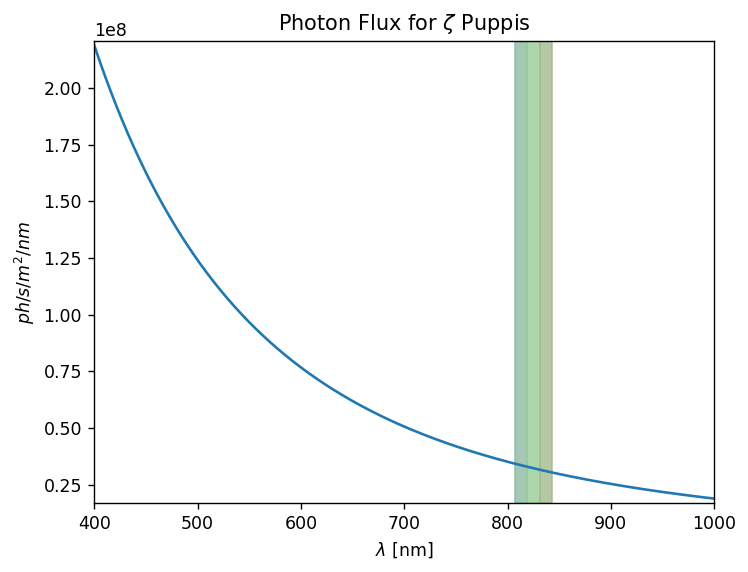

In [2]:
reload(cgi_phasec_poppy.source_flux)

wavelength_c = 825e-9*u.m

nwaves = 3
bandwidth = 2.9/100
minwave = wavelength_c * (1 - bandwidth/2)
maxwave = wavelength_c * (1 + bandwidth/2)
wavelengths = np.linspace( minwave, maxwave, nwaves )

minlam = 400*u.nm
maxlam = 1000*u.nm
nlam = int((maxlam-minlam).value*20) + 1
lambdas = np.linspace(minlam, maxlam, nlam)

from astropy.constants import h, c, k_B, R_sun

zpup = cgi_phasec_poppy.source_flux.SOURCE(wavelengths=wavelengths,
                                            temp=40000*u.K,
                                            distance=300*u.parsec,
                                            diameter=2*14*R_sun,
                                            name='$\zeta$ Puppis', 
                                            lambdas=lambdas,
                                           )

zpup.plot_spectrum_ph()
source_fluxes = zpup.calc_fluxes()
total_flux = np.sum(source_fluxes)

for i,flux in enumerate(source_fluxes):
    print(f'\tFlux for wavelength {wavelengths[i]:.3e}: {flux:.3e}')
print(f'Total flux: {total_flux:.3e}')

In [3]:
reload(cgi_phasec_poppy.cgi)
reload(cgi_phasec_poppy.parallelized_cgi)

rayCGI = ray.remote(cgi_phasec_poppy.cgi.CGI) # make a ray actor class from the original CGI class  

kwargs = {
    'cgi_mode':'spc-wide',
    'npsf':150,
    'use_pupil_defocus':True,
    'use_opds':True,
    'polaxis':0,
}

actors = []
for i in range(nwaves):
    actors.append(rayCGI.options(num_cpus=2, num_gpus=1/8).remote(**kwargs))
    actors[i].setattr.remote('wavelength', wavelengths[i])
    actors[i].setattr.remote('source_flux', source_fluxes[i])

In [6]:
8e-4, 1.5/3600

(0.0008, 0.0004166666666666667)

In [4]:
em_gain = 200
full_well_image = 60000.  # e-
full_well_serial = 100000.  # e-
#status=1,
dark_current = 8e-4  # e-/pix/s
cic = 0.01  # e-/pix/frame
read_noise = 120.  # e-/pix/frame
bias = 500.  # e-
qe = 0.5
cr_rate = 0.  # hits/cm^2/s
pixel_pitch = 13e-6  # m
eperdn = 1 #7.,
nbits = 16
numel_gain_register=604

emccd = emccd_detect.EMCCDDetect(em_gain=em_gain,
                                    full_well_image=full_well_image,  # e-
                                    full_well_serial=full_well_serial,  # e-
                                    #status=status,
                                    dark_current=dark_current,  # e-/pix/s
                                    cic=cic,  # e-/pix/frame
                                    read_noise=read_noise,  # e-/pix/frame
                                    bias=bias,  # e-
                                    qe=qe,
                                    cr_rate=cr_rate,  # hits/cm^2/s
                                    pixel_pitch=pixel_pitch,  # m
                                    eperdn=eperdn,
                                    nbits=nbits,
                                    numel_gain_register=numel_gain_register,
                                    meta_path=meta_path
                                    )

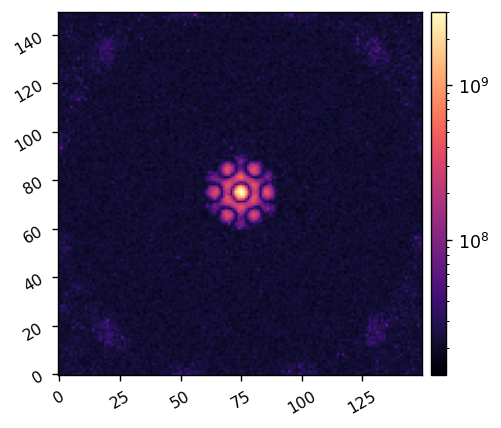

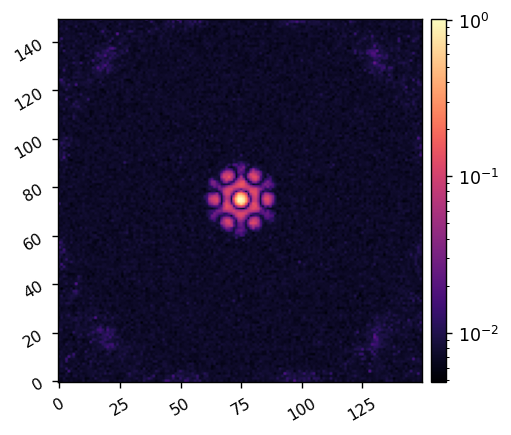

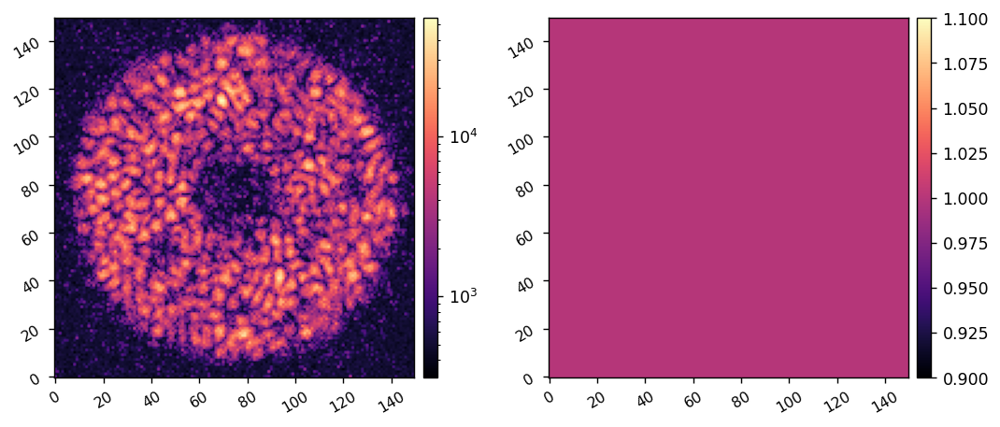

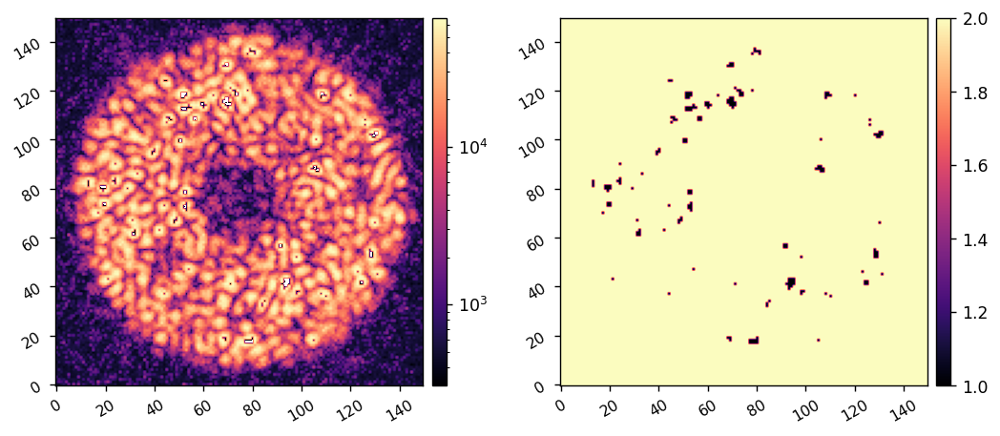

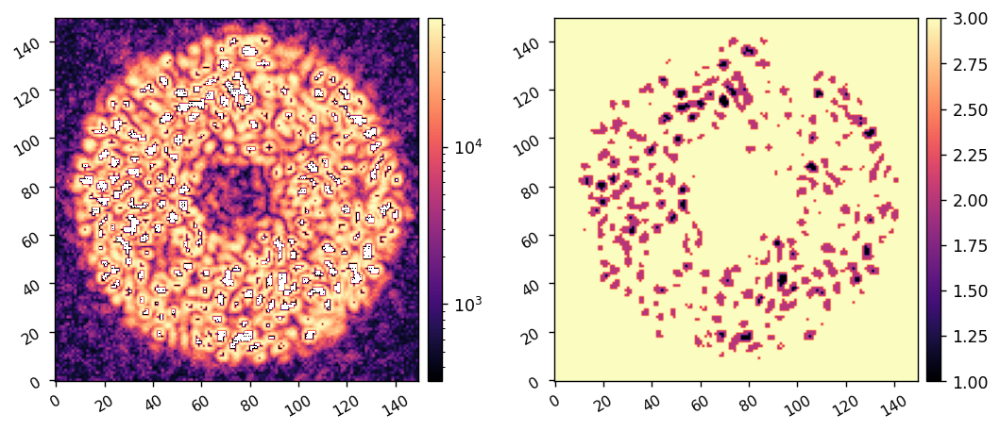

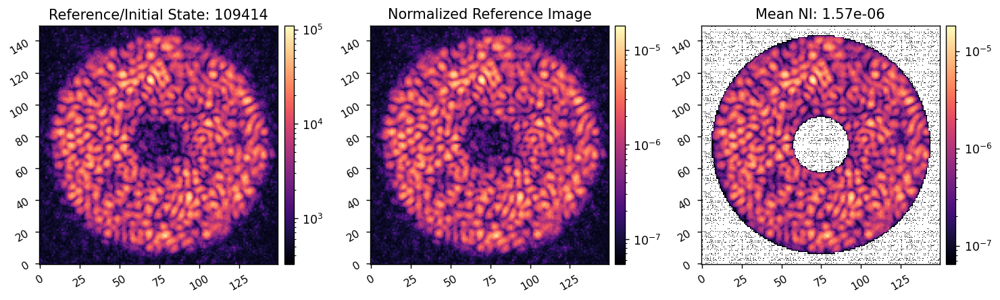

In [46]:
reload(cgi_phasec_poppy.parallelized_cgi)
mode = cgi_phasec_poppy.parallelized_cgi.ParallelizedCGI(actors=actors, dm1_ref=dm1_flat, dm2_ref=dm2_flat)

mode.use_photon_noise = True
mode.EMCCD = emccd
# mode.subtract_bias = True

unocc_exp_time = 0.00001
unocc_em_gain = 250

mode.set_actor_attr('use_fpm',False)
mode.Nframes = 5
mode.exp_time = unocc_exp_time
mode.EMCCD.em_gain = unocc_em_gain

# dark = mode.snap_dark()
# ref_unocc_im = xp.abs(mode.snap() - dark)
# imshow1(xp.abs(ref_unocc_im), lognorm=True)

unocc_exp_times = [0.00001, 0.00005, 0.0001]

im = mode.snap_many(unocc_exp_times)
imshow1(im, lognorm=True)

mode.normalize = True
mode.Imax_ref = xp.max(im.max())
mode.em_gain_ref = unocc_em_gain

ref_unocc_im = mode.snap_many(unocc_exp_times)
imshow1(ref_unocc_im, lognorm=True)

mode.EMCCD.em_gain = 500

mode.set_actor_attr('use_fpm',True)
occ_exp_times = [0.5,2,5]
ref_im = mode.snap_many(occ_exp_times, plot=True)

control_mask = utils.create_annular_focal_plane_mask(mode, inner_radius=5.4, outer_radius=20.6, edge=None)
mean_ni = xp.mean(ref_im[control_mask])
imshow3(ref_im/mode.norm_factor, ref_im, ref_im*control_mask, 
        f'Reference/Initial State: {xp.max(ref_im/mode.norm_factor):.0f}', 
        'Normalized Reference Image',
        f'Mean NI: {mean_ni:.2e}',
        lognorm=True,)


# Create calibration and probe modes

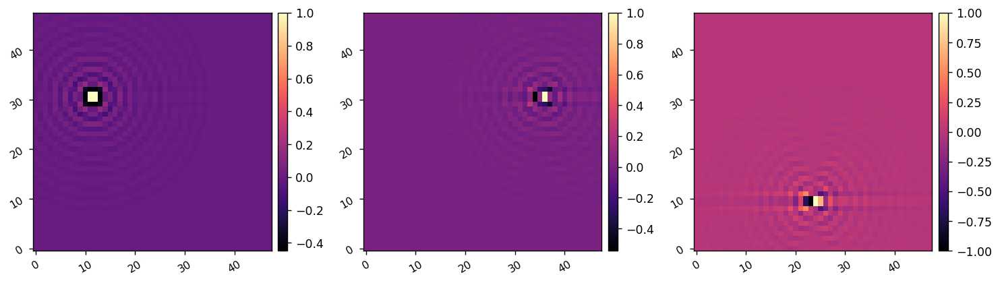

In [47]:
probe_modes = utils.create_fourier_probes(mode, control_mask, fourier_sampling=0.2,
                                          shift=[(-12,7), (12,7),(0,-14), (0,0)], nprobes=3,
                                           use_weighting=True)
imshow3(probe_modes[0], probe_modes[1], probe_modes[2])

(4096, 4608)


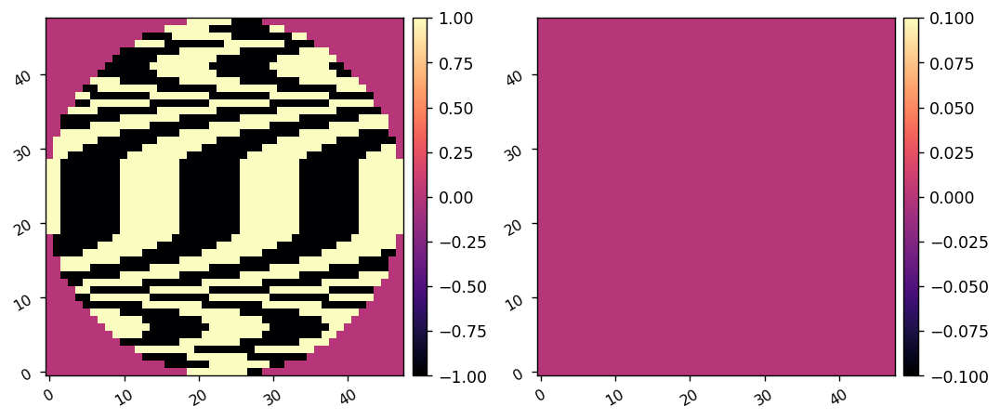

In [48]:
calib_modes = utils.create_hadamard_modes(mode.dm_mask, ndms=2)
Nmodes = calib_modes.shape[0]
print(calib_modes.shape)
i = 8
imshow2(calib_modes[i,:mode.Nact**2].reshape(mode.Nact,mode.Nact), calib_modes[i+mode.Nacts,mode.Nact**2:].reshape(mode.Nact,mode.Nact))


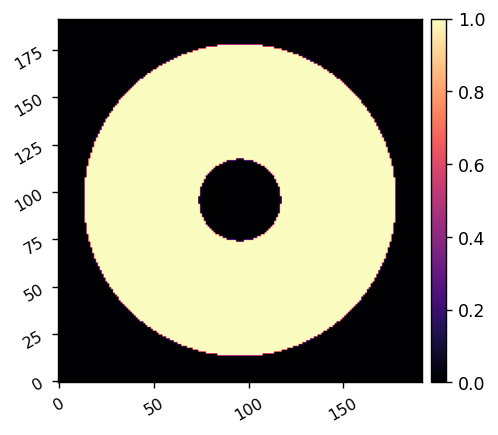

(4096,)


In [9]:
reload(utils)
oversamp = 4

had_modes = xp.array(calib_modes)
ft_modes = []
for i in range(calib_modes.shape[0]//2):
    had_mode = had_modes[i,:mode.Nact**2].reshape(mode.Nact, mode.Nact)
    ft_modes.append(xp.fft.fftshift(xp.fft.fft2(xp.fft.ifftshift(utils.pad_or_crop(had_mode, mode.Nact*oversamp)))))
mode_freqs = xp.abs(xp.array(ft_modes))**2

mode_freq_mask_pxscl = 1/oversamp
x = (xp.linspace(-mode.Nact*oversamp//2, mode.Nact*oversamp//2-1, mode.Nact*oversamp) + 1/2)*mode_freq_mask_pxscl
x,y = xp.meshgrid(x,x)
r = xp.sqrt(x**2+y**2)
mode_freq_mask = (r>5.4)*(r<20.6)
imshow1(mode_freq_mask)

sum_vals = []
max_vals = []
for i in range(calib_modes.shape[0]//2):
    sum_vals.append(xp.sum(mode_freqs[i, mode_freq_mask]))
    max_vals.append(xp.max(mode_freqs[i, mode_freq_mask]))

biggest_sum = xp.max(xp.array(sum_vals))
biggest_max = xp.max(xp.array(max_vals))

scale_factors = []
for i in range(calib_modes.shape[0]//2):
    scale_factors.append((biggest_max/max_vals[i])**(1/4))
    # scale_factors.append(xp.exp(-(biggest_max/max_vals[i]-1)))
scale_factors = ensure_np_array(xp.array(scale_factors))
# scale_factors[scale_factors>2] = 2
# scale_factors[scale_factors<1/2] = 1/2

scale_factors = np.concatenate([scale_factors,scale_factors])
print(scale_factors.shape)

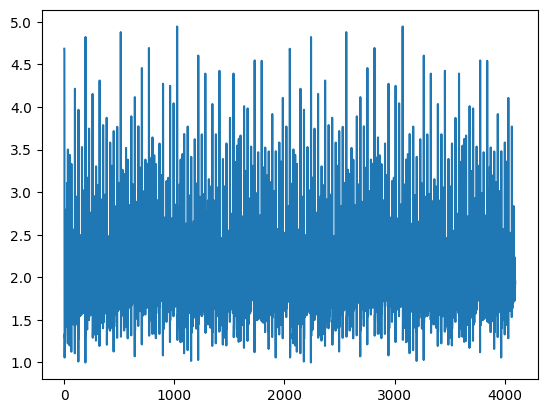

In [74]:
plt.plot(scale_factors)

In [75]:
xp.argmax(xp.array(max_vals)), xp.argmax(xp.array(sum_vals))

(array(192), array(96))

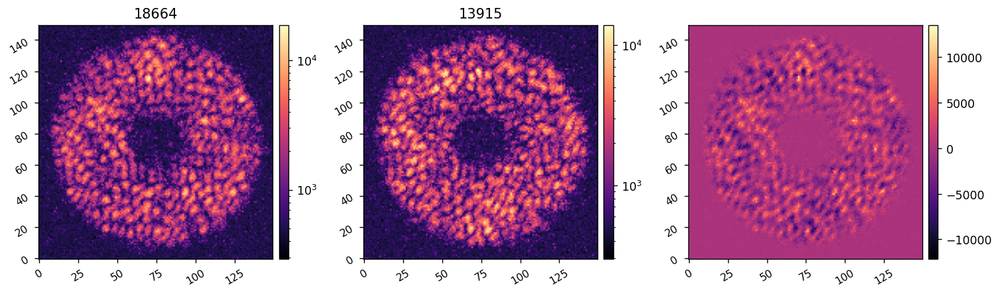

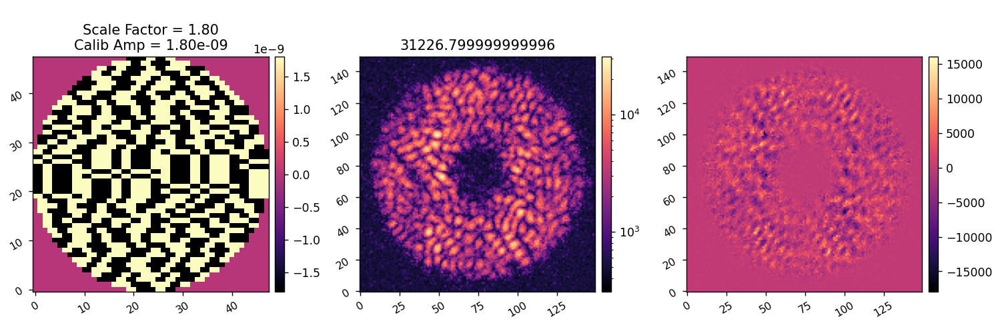

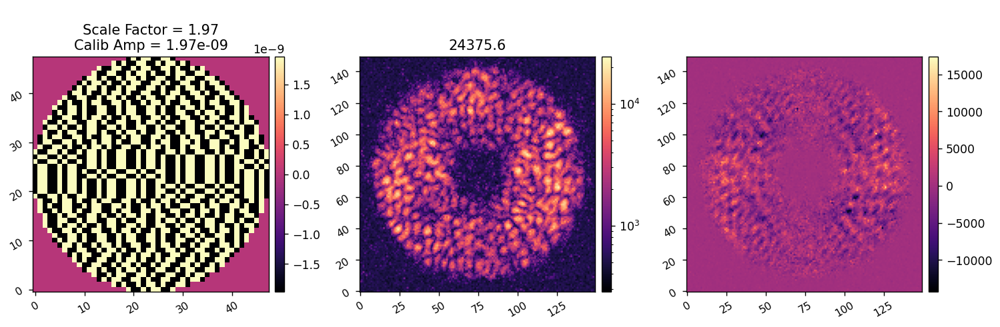

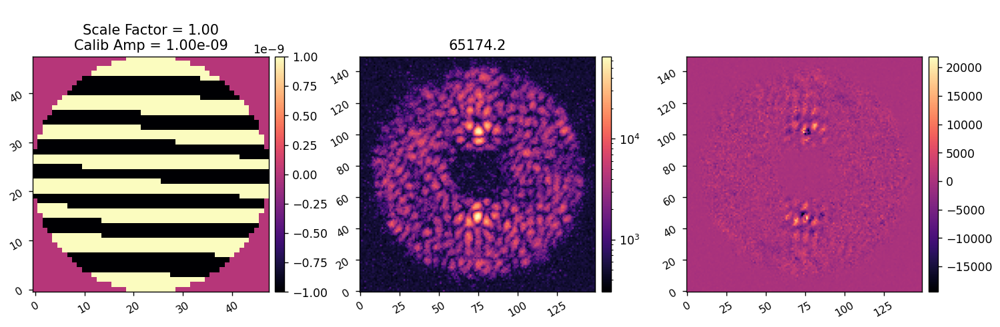

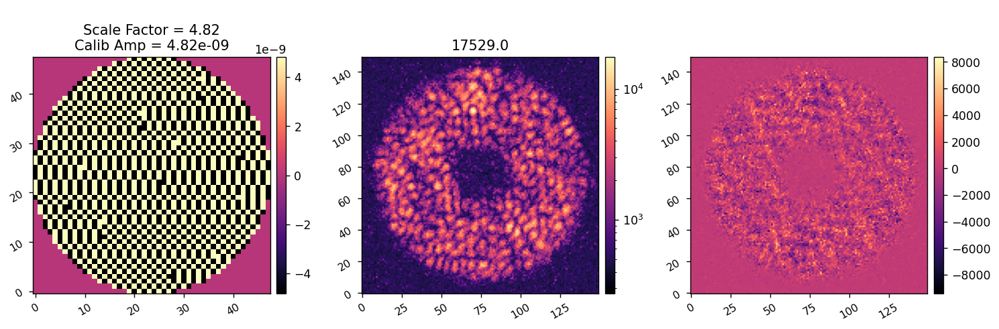

...

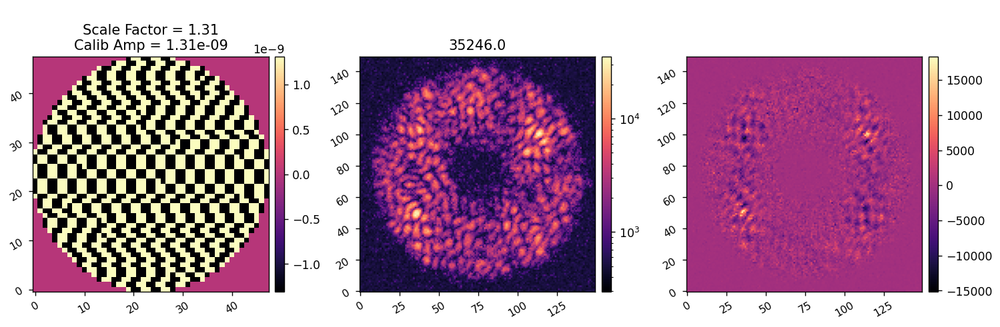

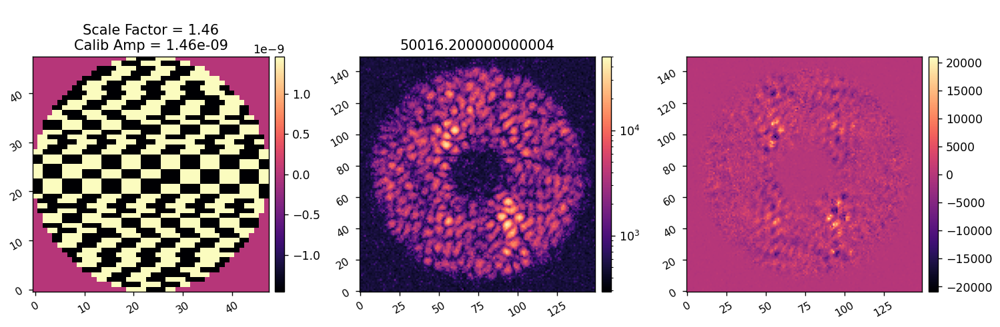

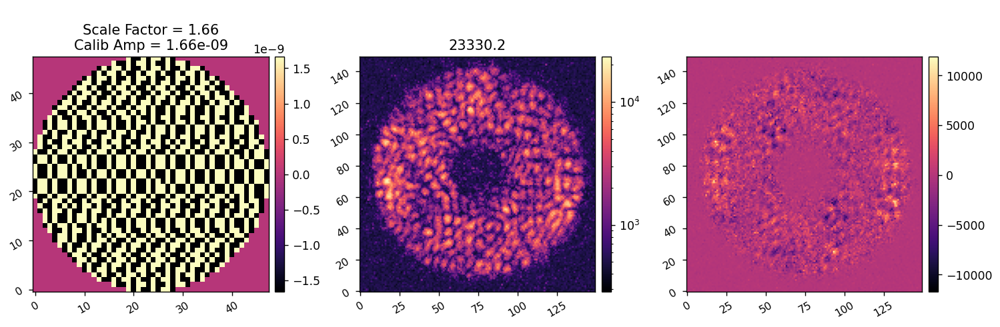

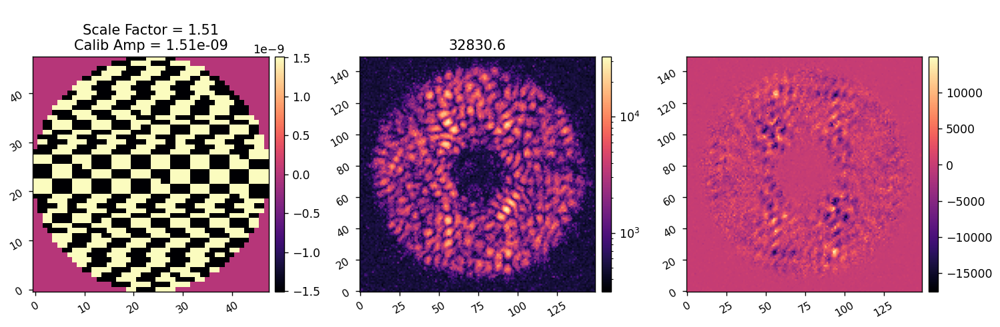

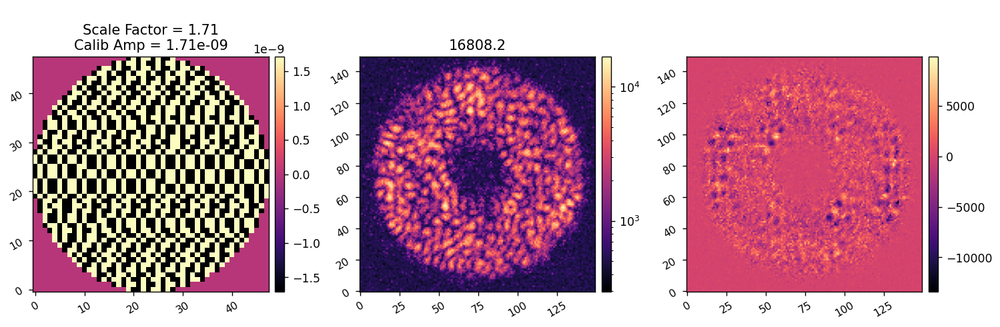

In [83]:
mode.normalize = True
mode.reset_dms()
mode.EMCCD.em_gain = 250
mode.exp_time = 0.2
mode.Nframes = 5

calib_amp = 5e-9
probe_amp = 20e-9

mode.add_dm1(probe_amp*probe_modes[0])
probed_im1 = mode.snap()/mode.norm_factor
mode.add_dm1(-probe_amp*probe_modes[0])

mode.add_dm1(-probe_amp*probe_modes[0])
probed_im2 = mode.snap()/mode.norm_factor
mode.add_dm1(probe_amp*probe_modes[0])

ref_diff = probed_im1-probed_im2
imshow3(probed_im1, probed_im2, ref_diff, 
        f'{xp.max(probed_im1):.0f}', f'{xp.max(probed_im2):.0f}', 
          lognorm1=True, lognorm2=True)


for i in range(190, 200):
        dm_mode = calib_modes[i,:mode.Nact**2].reshape(mode.Nact,mode.Nact)
        scaled_calib_amp = calib_amp * scale_factors[i]
        # print(scale_factors[i], scaled_calib_amp)

        # mode.add_dm1(scaled_calib_amp*dm_mode)
        # mode.add_dm1(probe_amp*probe_modes[0])
        # im1 = mode.snap()
        # mode.add_dm1(-probe_amp*probe_modes[0])
        # mode.add_dm1(-scaled_calib_amp*dm_mode)

        mode.add_dm1(scaled_calib_amp*dm_mode)
        mode.add_dm1(probe_amp*probe_modes[0])
        im1 = mode.snap()
        mode.add_dm1(-probe_amp*probe_modes[0])

        mode.add_dm1(-probe_amp*probe_modes[0])
        im2 = mode.snap()
        mode.add_dm1(probe_amp*probe_modes[0])
        mode.add_dm1(-scaled_calib_amp*dm_mode)
        
        diff_im = im1/mode.norm_factor - im2/mode.norm_factor

        imshow3(scaled_calib_amp*dm_mode, im1/mode.norm_factor, diff_im - ref_diff,
                f'\nScale Factor = {scale_factors[i]:.2f}\nCalib Amp = {scaled_calib_amp:.2e}', 
                f'{xp.max(im1/mode.norm_factor)}', 
                lognorm2=True)
# imshow2(im, im-ref_im, lognorm1=True)

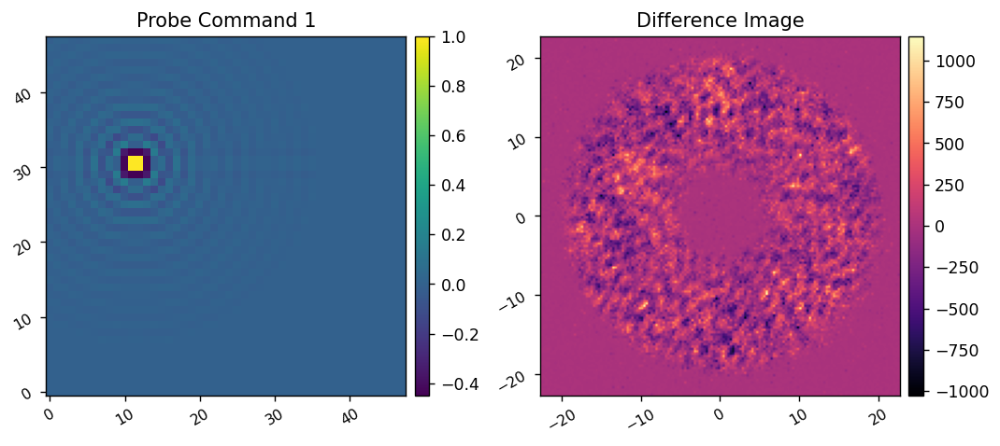

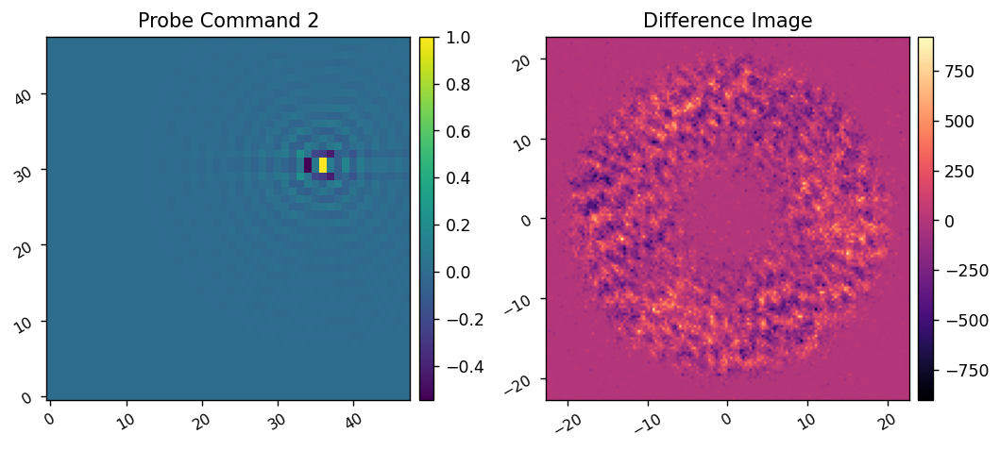

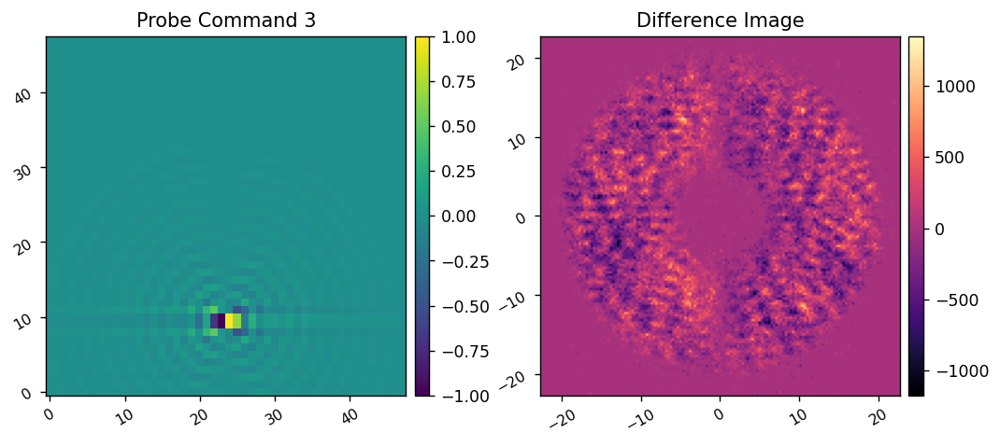

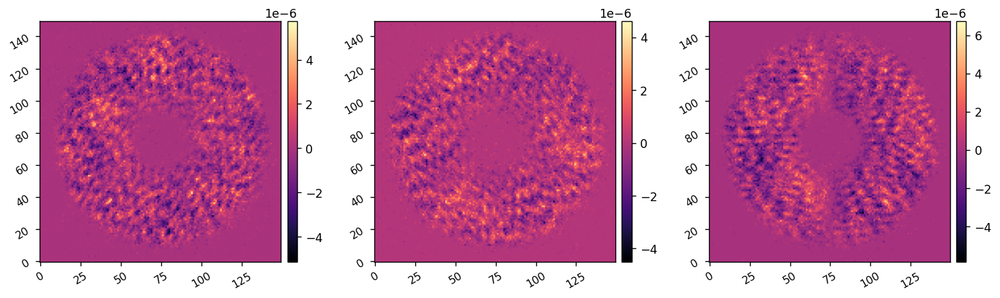

In [120]:
reload(iefc_2dm)
mode.normalize = True

calib_amp = 2.5e-9
probe_amp = 25e-9

mode.add_dm1(calib_amp*calib_modes[i,:mode.Nact**2].reshape(mode.Nact,mode.Nact))
differential_images, single_images = iefc_2dm.take_measurement(mode, probe_modes, probe_amp, return_all=True, plot=True)
ims = 2*calib_amp*differential_images.reshape(probe_modes.shape[0], mode.npsf, mode.npsf)
mode.add_dm1(-calib_amp*calib_modes[i,:mode.Nact**2].reshape(mode.Nact,mode.Nact))

imshow3(ims[0], ims[1], ims[2])


Calibrating iEFC...
	Calibrated mode 2/2 in 23.897s
Calibration complete.


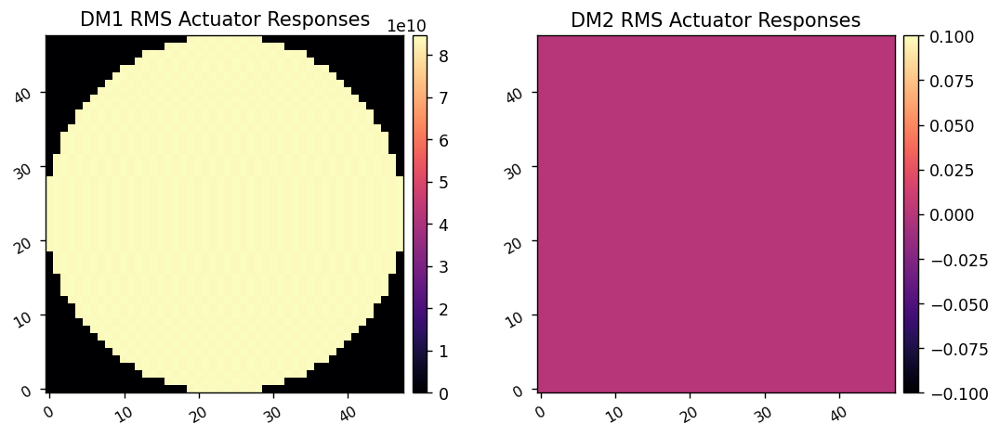

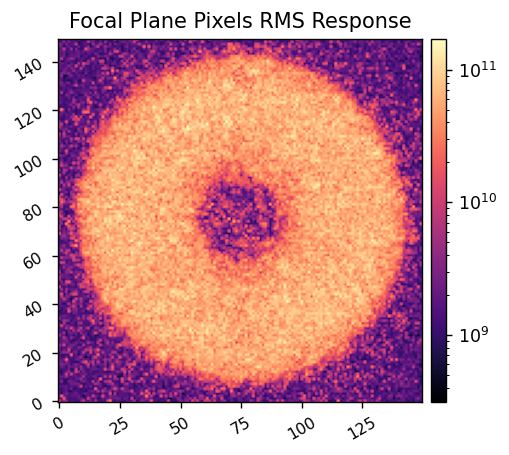

Saved data to:  /home/kianmilani/Projects/roman-cgi-iefc-data/response-data/test_response_matrix_20231220.fits


In [40]:
reload(iefc_2dm)

# calib_amp = 5e-9

response_matrix, response_cube = iefc_2dm.calibrate(mode, 
                                                    control_mask,
                                                    probe_amp, probe_modes, 
                                                     calib_amp, calib_modes[:2], 
                                                     return_all=True, 
#                                                     plot_responses=False,
                                                   )

utils.save_fits(response_dir/f'test_response_matrix_{today}.fits', response_matrix)
# utils.save_fits(response_dir/f'test_response_cube_{today}.fits', response_cube)


In [10]:
date = 20230912
date = 20230913
date = 20230918
date = 20230920
# date = 20230921
date = 20231017
date = 20231220
date = 20231227
response_matrix = xp.array(fits.getdata(response_dir/f'spc_wide_band4b_emccd_response_matrix_{date}.fits'))
response_info = fits.getheader(response_dir/f'spc_wide_band4b_emccd_response_matrix_{date}.fits')
display(response_info)
# response_cube = xp.array(fits.getdata(data_dir/response_dir/f'spc_wide_825_poke_modes_response_cube_{date}.fits'))

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 4096                                                  
NAXIS2  =                40572                                                  
EM_GAIN =                  250                                                  
NFRAMES =                    5                                                  
EXP_TIME=                  0.2                                                  

In [21]:
xp.mean(response_matrix.dot(xp.array(calib_modes)), axis=0).shape

(4608,)

8695831096331.326


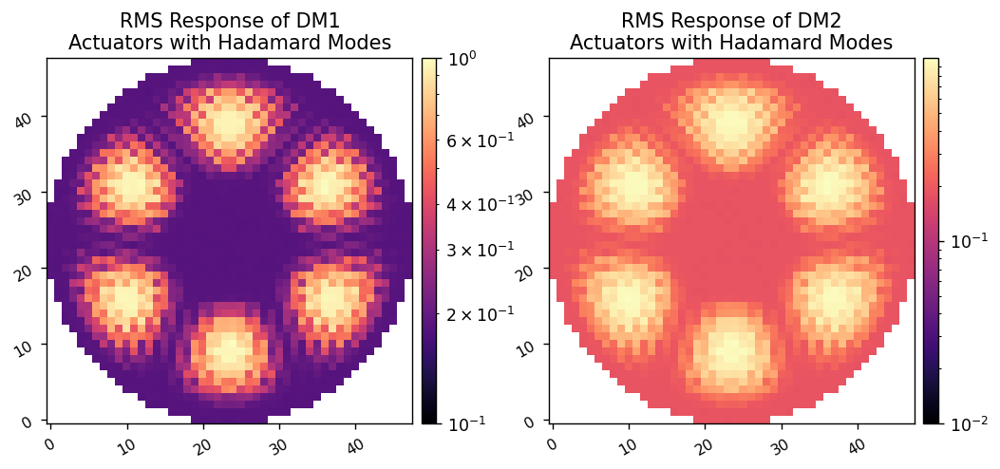

In [12]:
response_matrix.shape

dm_response = xp.sqrt(xp.mean(response_matrix.dot(xp.array(calib_modes))**2, axis=0))
dm1_response = dm_response[:mode.Nact**2].reshape(mode.Nact, mode.Nact)/dm_response.max()
dm2_response = dm_response[mode.Nact**2:].reshape(mode.Nact, mode.Nact)/dm_response.max()

print(dm_response.max())
imshow2(dm1_response, dm2_response, 
        'RMS Response of DM1\nActuators with Hadamard Modes', 'RMS Response of DM2\nActuators with Hadamard Modes',
        lognorm=True, vmin1=0.1, vmin2=0.01,
        )


# Run IEFC

In [109]:
mode.reset_dms()
images = xp.array([ref_im])
dm1_commands = xp.array([mode.get_dm1()])
dm2_commands = xp.array([mode.get_dm2()])
regs = xp.array([])

mode.reset_dms()

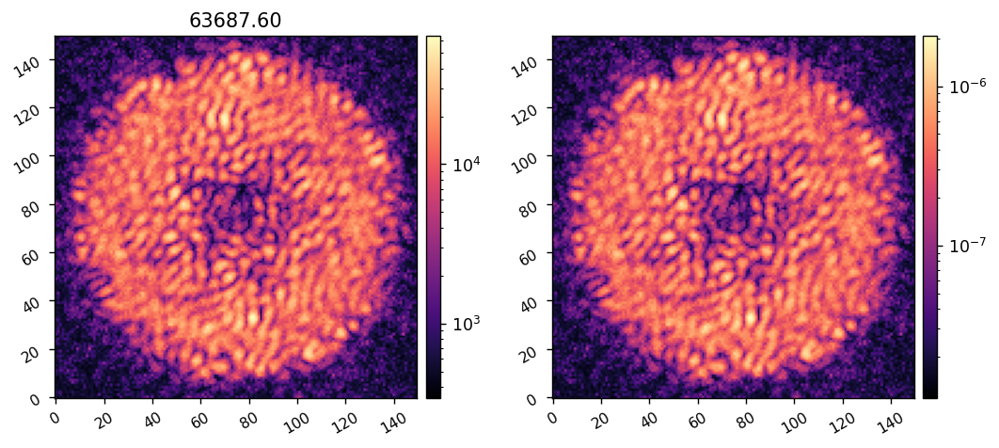

In [136]:
mode.normalize = True

probe_exp_time = 10

mode.exp_time = probe_exp_time
mode.Nframes = 5
mode.EMCCD.em_gain = 250

probe_amp = 5e-9

mode.add_dm1(probe_amp*probe_modes[0])
im = mode.snap()
mode.add_dm1(-probe_amp*probe_modes[0])

imshow2(im/mode.norm_factor, im, f'{xp.max(im/mode.norm_factor):.2f}', lognorm=True,)

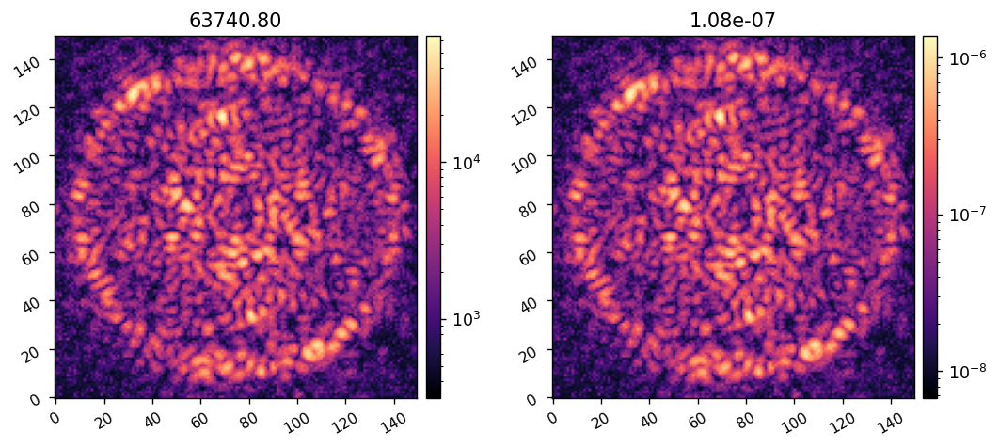

In [139]:
metric_exp_time = 15

mode.exp_time = metric_exp_time
mode.Nframes = 5
mode.EMCCD.em_gain = 250

im = mode.snap()
mean_ni = xp.mean(im[control_mask])
imshow2(im/mode.norm_factor, im, 
        f'{xp.max(im/mode.norm_factor):.2f}',
        f'{mean_ni:.2e}',
         lognorm=True,)

In [144]:
reg_fun = utils.beta_reg
reg_conds = -3

Running iEFC...
	Closed-loop iteration 19 / 21


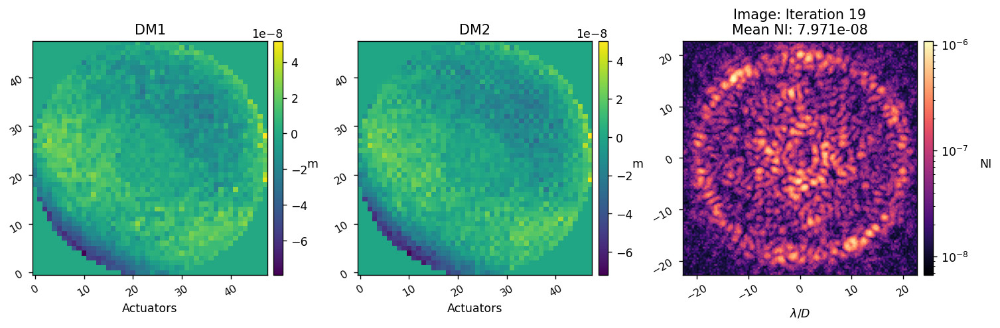

	Closed-loop iteration 20 / 21


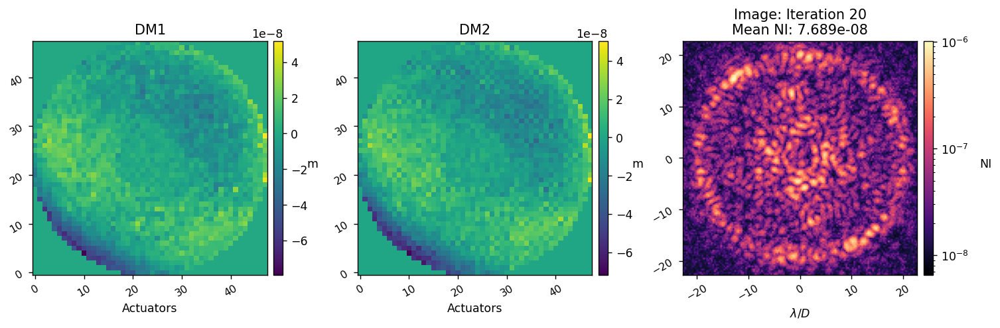

	Closed-loop iteration 21 / 21


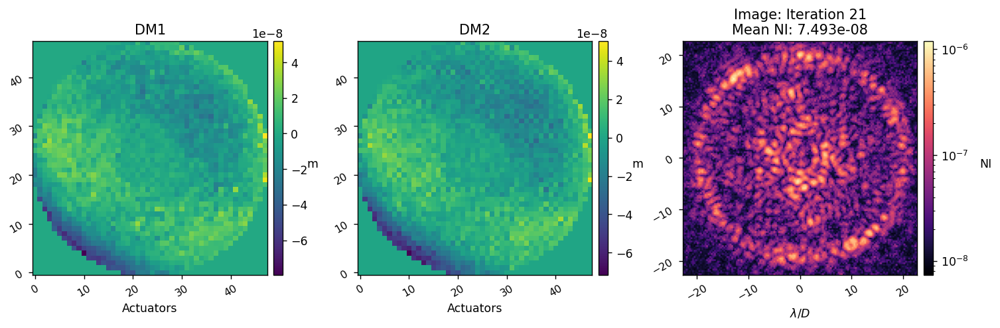

Closed loop for given control matrix completed in 23.273s.


In [145]:
reload(iefc_2dm)
reload(utils)

mode.normalize = True

images, dm1_commands, dm2_commands, regs = iefc_2dm.run(mode, 
                                                        response_matrix,
                                                        reg_fun, reg_conds, 
                                                        probe_modes, 
                                                        probe_amp, 
                                                        calib_modes,
                                                        control_mask, 
                                                        num_iterations=3, 
                                                        loop_gain=0.5, 
                                                        leakage=0,
                                                        probe_exp_time=probe_exp_time,
                                                        probe_nframes=5,
                                                        probe_em_gain=250,
                                                        metric_exp_time=metric_exp_time,
                                                        metric_nframes=5,
                                                        metric_em_gain=250,
                                                        plot_all=True,
                                                        plot_radial_contrast=False,
                                                        old_images=images,
                                                        old_dm1_commands=dm1_commands,
                                                        old_dm2_commands=dm2_commands,
                                                        old_regs=regs,
                                              )

In [108]:
utils.save_fits(response_dir/f'spc_wfov_band4b_emccd_dm1_commands_{today}.fits', dm1_commands)
utils.save_fits(response_dir/f'spc_wfov_band4b_emccd_dm2_commands_{today}.fits', dm2_commands)
utils.save_fits(response_dir/f'spc_wfov_band4b_emccd_images_{today}.fits', images)
# utils.save_fits(response_dir/f'spc_wfov_band4b_emccd_regs_{today}.fits', regs)

Saved data to:  /home/kianmilani/Projects/roman-cgi-iefc-data/response-data/spc_wfov_band4b_emccd_dm1_commands_20231228.fits
Saved data to:  /home/kianmilani/Projects/roman-cgi-iefc-data/response-data/spc_wfov_band4b_emccd_dm2_commands_20231228.fits
Saved data to:  /home/kianmilani/Projects/roman-cgi-iefc-data/response-data/spc_wfov_band4b_emccd_images_20231228.fits
